In [318]:
import pandas, seaborn, scipy, numpy, matplotlib, collections, sklearn, math, seaborn
import sklearn.linear_model
import os


%matplotlib inline
from matplotlib import pyplot

# Constants
library_sizes = {
    'WGS': 3002000000,
    'WES': 50160183,
}
mhc_binding_threshold_affinity = 500

%matplotlib inline
%config InlineBackend.figure_format = 'png'

matplotlib.rc("savefig", dpi=800)
#matplotlib.rc("savefig", dpi=72)
matplotlib.rc('text', usetex=True)
#reload(c)

pandas.set_option('display.max_rows', 50)
pandas.set_option('display.max_columns', 50)

def print_full(x):
    pandas.set_option('display.max_rows', len(x))
    print(x)
    pandas.reset_option('display.max_rows')
    
def bootstrap(values, statistic=numpy.mean, samples=5000):
    values = pandas.Series(values).dropna()
    if len(values) <= 1:
        return (numpy.nan, numpy.nan)
    values = [statistic(sklearn.utils.resample(values)) for i in range(samples)]
    return (numpy.percentile(values, 5), numpy.percentile(values, 95))

def round_to_n(x, n):
    return round(x, -int(math.floor(math.log10(x))) + (n - 1)) 

def mean_with_errorbars(values, decimals=0, plusminus=False, function=numpy.mean):
    pattern = "%%0.%df" % decimals
    bars = bootstrap(values, statistic=function)
    if numpy.nan in bars:
        return pattern % function(values)
    diff = (bars[1] - bars[0]) / 2
    if decimals == 0:
        bars = (round_to_n(bars[0], 2), round_to_n(bars[1], 2))
        diff = round_to_n(diff, 1)
    if plusminus:
        return (pattern + " $\\pm$ " + pattern) % (function(values), diff)
    return (pattern + " (" + pattern + "-" + pattern + ")") % ((function(values),) + bars)

def median_with_errorbars(values, decimals=0, plusminus=False, function=numpy.median):
    return mean_with_errorbars(values, decimals, plusminus, function)


import lifelines

def maybe_int(s):
    try:
        return str(int(s))
    except ValueError:
        return str(s)

In [2]:
cohort_df = pandas.read_csv("../data/Additional File 1.pre_review.csv")
cohort_df

,source_id,RNA_id,RNA biospecimen,DNA_id,DNA_biospecimen,specimen_type_description,CollectionPoint,SpecimenType,RNA data file,DNA_sample_string,icgc_sample_id,project_code,submitted_sample_id,icgc_specimen_id,submitted_specimen_id,icgc_donor_id,submitted_donor_id,analyzed_sample_interval,percentage_cellularity,level_of_cellularity,study,study_specimen_involved_in,specimen_type,specimen_type_other,specimen_interval,...,other snv mutations,other snv neoantigens,other snv expressed neoantigens,snv mutations,snv neoantigens,snv expressed neoantigens,mnv mutations,mnv neoantigens,mnv expressed neoantigens,indel mutations,indel neoantigens,indel expressed neoantigens,carboplatin,paclitaxel,liposomal doxorubicin,gemcitabine,cyclophosphamide,topotecan,cisplatin,olaparib,docetaxel,bevacizumab,etoposide,nab-paclitaxel,farletuzumab/placebo
0,AOCS-001-1-7,ICGCDBDE20130916001,AOCS-001-2-0,AOCS_001_ICGC_DBPC_20130205_002,AOCS-001-1-7,primary tumour,Primary,Tumour,130906_D81P8DQ1_0153_C2704ACXX.nopd.AOCS_001_I...,ICGCDBPC20130205002,SA505244,OV-AU,AOCS-001-1-7,SP101515,AOCS-001-1,DO46325,AOCS-001,1895.0,73.0,61-80%,PCAWG,PCAWG,Primary tumour - solid tissue,NaN,0,...,0.335747,0.270605,0.293826,5686.0,104.0,71.0,0.010268,0.016393,0.000000,0.014925,0.131148,0.000000,False,False,False,False,False,False,False,False,False,False,False,False,False
1,AOCS-004-1-5,ICGCDBDE20130916003,AOCS-004-2-9,AOCS_004_ICGC_DBPC_20130205_004,AOCS-004-1-5,primary tumour,Primary,Tumour,130906_D81P8DQ1_0157_C270DACXX.nopd.AOCS_004_I...,ICGCDBPC20130205004,SA505270,OV-AU,AOCS-004-1-5,SP101519,AOCS-004-1,DO46327,AOCS-004,1350.0,77.0,61-80%,PCAWG,PCAWG,Primary tumour - solid tissue,NaN,0,...,0.435291,0.362958,0.519262,6587.0,48.0,20.0,0.008726,0.000000,0.000000,0.029851,0.172414,0.000000,False,False,False,False,False,False,False,False,False,False,False,False,False
2,AOCS-005-1-8,ICGCDBDE20130916004,AOCS-005-2-1,AOCS_005_ICGC_DBPC_20130205_006,AOCS-005-1-8,primary tumour,Primary,Tumour,130906_D81P8DQ1_0157_C270DACXX.nopd.AOCS_005_I...,ICGCDBPC20130205006,SA505282,OV-AU,AOCS-005-1-8,SP101521,AOCS-005-1,DO46328,AOCS-005,2128.0,90.0,>81%,PCAWG,PCAWG,Primary tumour - solid tissue,NaN,0,...,0.525860,0.456709,0.373072,5582.0,60.0,36.0,0.005167,0.000000,0.000000,0.033898,0.000000,0.000000,False,False,False,False,False,False,False,False,False,False,False,False,False
3,AOCS-034-1-0,ICGCDBLG2010050402TR,AOCS-034-2-4,AOCS_034_ICGC_DBPC_20130205_009,AOCS-034-1-0,primary tumour,Primary,Tumour,131206_EXTERN_0045_AC2KJBACXX.nopd.AOCS_034_IC...,ICGCDBPC20130205009,SA505297,OV-AU,AOCS-034-1-0,SP101523,AOCS-034-1,DO46329,AOCS-034,1953.0,84.0,>81%,PCAWG,PCAWG,Primary tumour - solid tissue,NaN,0,...,0.249783,0.223347,0.270322,6858.0,154.0,58.0,0.007520,0.005988,0.016949,0.051020,0.071856,0.000000,False,False,False,False,False,False,False,False,False,False,False,False,False
4,AOCS-034-3-8,ICGCDBDE20131122024,AOCS-034-4-1,AOCS_034_ICGC_DBPC_20130205_007,AOCS-034-3-8,recurrent ascitic fluid,Recurrence,Ascites,131206_EXTERN_0045_AC2KJBACXX.nopd.AOCS_034_IC...,ICGCDBPC20130205007,SA505303,OV-AU,AOCS-034-3-8,SP101524,AOCS-034-13,DO46329,AOCS-034,110.0,99.0,>81%,NaN,NaN,Recurrent tumour - other,recurrent ascitic fluid,1597,...,0.371331,0.434420,0.497789,13091.0,259.0,123.0,0.010501,0.003731,0.008065,0.045752,0.029851,0.000000,True,True,True,True,False,True,False,False,False,False,False,False,False
5,AOCS-055-1-7,ICGCDBDE20130916005,AOCS-055-2-0,AOCS_055_ICGC_DBPC_20130205_011,AOCS-055-1-7,primary tumour,Primary,Tumour,130906_D81P8DQ1_0153_C2704ACXX.nopd.AOCS_055_I...,ICGCDBPC20130205011,SA505316,OV-AU,AOCS-055-1-7,SP101526,AOCS-055-1,DO46330,AOCS-055,2150.0,82.0,>81%,PCAWG,PCAWG,Primary tumour - solid tissue,NaN,0,...,0.593488,0.512771,0.607863,14583.0,152.0,91.0,0.004165,0.000000,0.000000,0.013423,0.116279,0.000000,False,False,False,False,False,False,False,False,False,False,False,False,False
6,AOCS-056-1-X,ICGCDBLG2010062229TR,AOCS-056-2-3,AOCS_056_ICGC_DBPC_20130205_013,AOCS-056-1-X,primary tumou

In [3]:
paired_cohort_df = cohort_df.ix[cohort_df.treated_paired]

index_order = ["primary/untreated", "primary/treated", "relapse/treated"]
print("Donors")
print(cohort_df.groupby("specific_treatment").donor.nunique()[index_order])
print()

print("Tissue type")
print(cohort_df.groupby(["specific_treatment", "tissue_type"]).donor.count()[index_order])
print()

print("Treated paired")
print(paired_cohort_df.groupby(["specific_treatment", "tissue_type"]).donor.count()[index_order])
print()

print("Total")
print(cohort_df.groupby(["specific_treatment"]).donor.count()[index_order])
print()

print("Total")
print(paired_cohort_df.groupby(["specific_treatment"]).donor.count()[index_order])
print()

print("Row total: patients")
print(cohort_df.donor.nunique())
print()

print("Row total: tissue type")
print(cohort_df.tissue_type.value_counts())
print()

print("Row total: matched tissue type")
print(paired_cohort_df.tissue_type.value_counts())
print()

print("Grand total")
print(len(cohort_df))
print()

Donors
specific_treatment
primary/untreated    76
primary/treated       5
relapse/treated      23
Name: donor, dtype: int64

Tissue type
specific_treatment  tissue_type
primary/untreated   ascites         4
                    solid          75
primary/treated     solid           5
relapse/treated     ascites        24
                    solid           6
Name: donor, dtype: int64

Treated paired
specific_treatment  tissue_type
primary/untreated   ascites         2
                    solid          11
relapse/treated     ascites        10
                    solid           4
Name: donor, dtype: int64

Total
specific_treatment
primary/untreated    79
primary/treated       5
relapse/treated      30
Name: donor, dtype: int64

Total
specific_treatment
primary/untreated    13.0
primary/treated       NaN
relapse/treated      14.0
Name: donor, dtype: float64

Row total: patients
92

Row total: tissue type
solid      86
ascites    28
Name: tissue_type, dtype: int64

Row total: matched tissu

In [4]:
chemos = [
    "carboplatin", "cisplatin", "cyclophosphamide", "etoposide", "gemcitabine", "paclitaxel",
]
cohort_df.groupby("specific_treatment")[chemos].sum().ix[index_order].iloc[1:].astype(int)

,carboplatin,cisplatin,cyclophosphamide,etoposide,gemcitabine,paclitaxel
specific_treatment,,,,,,
primary/treated,5,0,0,0,1,4
relapse/treated,30,5,10,1,17,30


In [5]:
paired_cohort_df.groupby("specific_treatment")[chemos].sum().ix[index_order].iloc[1:].fillna(0).astype(int)

,carboplatin,cisplatin,cyclophosphamide,etoposide,gemcitabine,paclitaxel
specific_treatment,,,,,,
primary/treated,0,0,0,0,0,0
relapse/treated,14,2,6,1,8,14


In [31]:
# Add CIBERSORT
cibersort_arman_df = pandas.read_table("../data/CIBERSORT_output.tsv.clean")

def one(items, debug_msg=''):
    if len(items) > 1:
        print("Multiple items: %s" % str(items))
    if not len(items):
        print("No items: %s" % debug_msg)
        return None
    return list(items)[0]

cibersort_arman_df["source_id"] = [
    one(cohort_df.ix[cohort_df["bam_filename_tumor_rna"].str.contains(row.Names)].source_id, row.Names)
    for _, row in cibersort_arman_df.iterrows()
]
cibersort_arman_df = cibersort_arman_df.ix[
    (cibersort_arman_df.source_id != "None") & (~cibersort_arman_df.source_id.isnull())
]
del cibersort_arman_df["Names"]
cibersort_arman_df
cibersort_arman_df["T cells"] = cibersort_arman_df[[x for x in cibersort_arman_df.columns if x.startswith("T cells")]].sum(1, skipna=False)
cibersort_arman_df.columns = [
    ("CIBERSORT %s" % c) if c != "source_id" else c
    for c in cibersort_arman_df.columns
]
for c in cibersort_arman_df.columns:
    if "Unnamed" in c:
        del cibersort_arman_df[c]

new_cohort_df = cohort_df.merge(cibersort_arman_df, on="source_id", how="left")

# Add donor data
donor_data_df = pandas.read_table("../data/donor.tsv")
new_cohort_df = new_cohort_df.merge(
    donor_data_df, how='left', left_on='donor', right_on='submitted_donor_id', suffixes=('', '_y'))
del new_cohort_df["icgc_donor_id_y"]
del new_cohort_df["project_code_y"]
del new_cohort_df["submitted_donor_id_y"]

# Add time since last chemo
time_since_last_chemo_df = pandas.read_excel(
    "../data/relapse_cases_chemo_summary_updated.corrected.xlsx", sheetname=1)
time_since_last_chemo_df.columns = ["patient", "days since last chemo"]
time_since_last_chemo_df.index = time_since_last_chemo_df.patient
time_since_last_chemo_df

new_cohort_df = new_cohort_df.merge(time_since_last_chemo_df, left_on="donor", right_on="patient", how="left")
new_cohort_df.loc[~new_cohort_df.treated, "days since last chemo"] = numpy.nan

# Add cycles & lines
chemo_lines_df = pandas.read_excel(
    "../data/relapse_cases_chemo_summary_updated.corrected.normalized.xlsx",
    sheetname=0)
del chemo_lines_df["icgc_donor_id"]
chemo_lines_df

chemo_line_cols = set()
for _, row in chemo_lines_df.iterrows():
    drug = row["DRUG NAME"].lower()
    if drug in new_cohort_df.columns:
        col = "Lines of %s" % drug
        chemo_line_cols.add(col)
        lines = float(row["Number of lines of chemotherapy"])
        new_cohort_df.loc[
            (new_cohort_df.submitted_donor_id == row.submitted_donor_id) & (new_cohort_df.treated),
            col
        ] = lines
        
        col = "Cycles of %s" % drug
        chemo_line_cols.add(col)
        lines = float(row["Number of cycles of chemotherapy"])
        new_cohort_df.loc[
            (new_cohort_df.submitted_donor_id == row.submitted_donor_id) & (new_cohort_df.treated),
            col
        ] = lines

new_cohort_df["Lines of platinum"] = new_cohort_df["Lines of carboplatin"] + new_cohort_df["Lines of cisplatin"].fillna(0)
new_cohort_df["Cycles of platinum"] = new_cohort_df["Cycles of carboplatin"] + new_cohort_df["Cycles of cisplatin"].fillna(0)

chemo_line_cols.add("Lines of platinum")       
chemo_line_cols.add("Cycles of platinum")       

chemo_line_cols = sorted(chemo_line_cols)

total_lines_per_donor = chemo_lines_df.groupby("submitted_donor_id")["Total lines for patient"].mean()
new_cohort_df["total lines"] = new_cohort_df.submitted_donor_id.map(total_lines_per_donor)
new_cohort_df["total cycles"] = new_cohort_df[[
    c for c in new_cohort_df.columns if c.startswith("Cycles of")
]].sum(1)

for c in chemo_line_cols:
    new_cohort_df[c] = new_cohort_df[c].fillna(0)

new_cohort_df.loc[~new_cohort_df.treated, "total lines"] = 0
new_cohort_df.loc[~new_cohort_df.treated, "total cycles"] = 0
new_cohort_df
new_cohort_df.to_csv("../additional-files/Additional File 1.csv", index=False)

No items: EGAZ00001018713
No items: EGAZ00001018777


In [16]:
print(', '.join(new_cohort_df))

source_id, RNA_id, RNA biospecimen, DNA_id, DNA_biospecimen, specimen_type_description, CollectionPoint, SpecimenType, RNA data file, DNA_sample_string, icgc_sample_id, project_code, submitted_sample_id, icgc_specimen_id, submitted_specimen_id, icgc_donor_id, submitted_donor_id, analyzed_sample_interval, percentage_cellularity, level_of_cellularity, study, study_specimen_involved_in, specimen_type, specimen_type_other, specimen_interval, specimen_donor_treatment_type, specimen_donor_treatment_type_other, specimen_processing, specimen_storage, tumour_confirmed, tumour_histological_type, tumour_grading_system, tumour_grade, tumour_stage_system, tumour_stage, cohort, donor, tissue_type, timepoint, treated, metastasis, interval_days, bam_filename_tumor_dna, bam_filename_tumor_rna, treated_paired, timepoint_paired, protein changing, peptides, expressed peptides, mutations, mutations_per_mb, indel, treatment, specific_treatment, fraction_peptides_expressed, percent_peptides_expressed, Cispla

In [11]:
new_cohort_df.ix[
    new_cohort_df["CIBERSORT T cells"].isnull()
]
new_cohort_df.shape

(114, 181)

In [12]:
new_cohort_df.fillna(0).groupby(["cisplatin", "Lines of cisplatin"]).source_id.nunique()
new_cohort_df.fillna(0).groupby(["cyclophosphamide", "Lines of cyclophosphamide"]).source_id.nunique()

cyclophosphamide  Lines of cyclophosphamide
False             0.0                          104
True              1.0                            8
                  2.0                            2
Name: source_id, dtype: int64

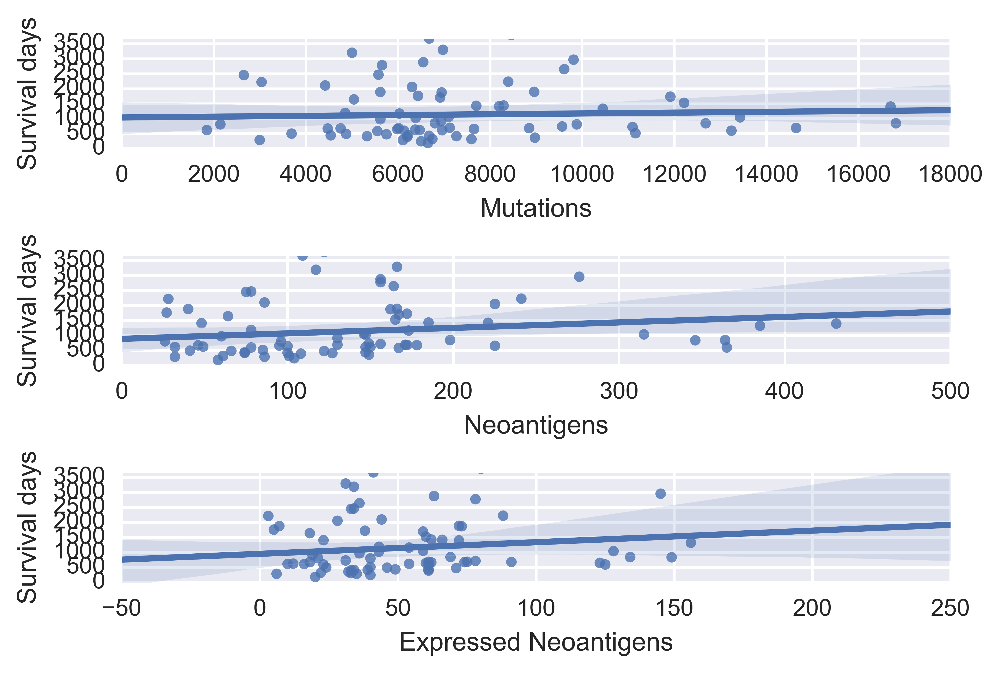

In [56]:
pyplot.subplot(311)
seaborn.regplot(
    data=new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
        & (new_cohort_df.mutations < 38722)
    ],
    x="mutations",
    y="donor_survival_time",
    #logx=True,
    robust=True,
    #hue="tissue_type",
)
pyplot.ylim(ymin=0, ymax=365 * 10)
pyplot.xlabel("Mutations")
pyplot.ylabel("Survival days")

pyplot.subplot(312)
seaborn.regplot(
    data=new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
        & (new_cohort_df.mutations < 38722)
    ],
    x="peptides",
    y="donor_survival_time",
    #logx=True,
    robust=True,
    #hue="tissue_type",
)
pyplot.ylim(ymin=0, ymax=365 * 10)
pyplot.xlabel("Neoantigens")
pyplot.ylabel("Survival days")


pyplot.subplot(313)
seaborn.regplot(
    data=new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
        & (new_cohort_df.mutations < 38722)
    ],
    x="expressed peptides",
    y="donor_survival_time",
    #logx=True,
    robust=True,
    #hue="tissue_type",
)
pyplot.ylim(ymin=0, ymax=365 * 10)
pyplot.xlabel("Expressed Neoantigens")
pyplot.ylabel("Survival days")

pyplot.tight_layout()


In [116]:
new_cohort_df.tumour_stage

0      III
1      III
2      III
3      III
4      NaN
5      III
6      III
7      III
8      III
9      III
10      IV
11     III
12     III
13     III
14     NaN
15     III
16     NaN
17     III
18      IV
19     III
20     III
21     III
22     III
23     III
24      IV
      ... 
89     III
90     NaN
91     NaN
92     III
93     III
94     NaN
95      IV
96     III
97     III
98     III
99     III
100    III
101    III
102    III
103    III
104    III
105    NaN
106    NaN
107    NaN
108    III
109    III
110    III
111    NaN
112    III
113    NaN
Name: tumour_stage, dtype: object

In [537]:
new_cohort_df.ix[new_cohort_df.donor == "AOCS-092"][["mutations", "peptides", "specific_treatment"]]

,mutations,peptides,specific_treatment
34,8192,48,primary/untreated
35,15850,71,relapse/treated


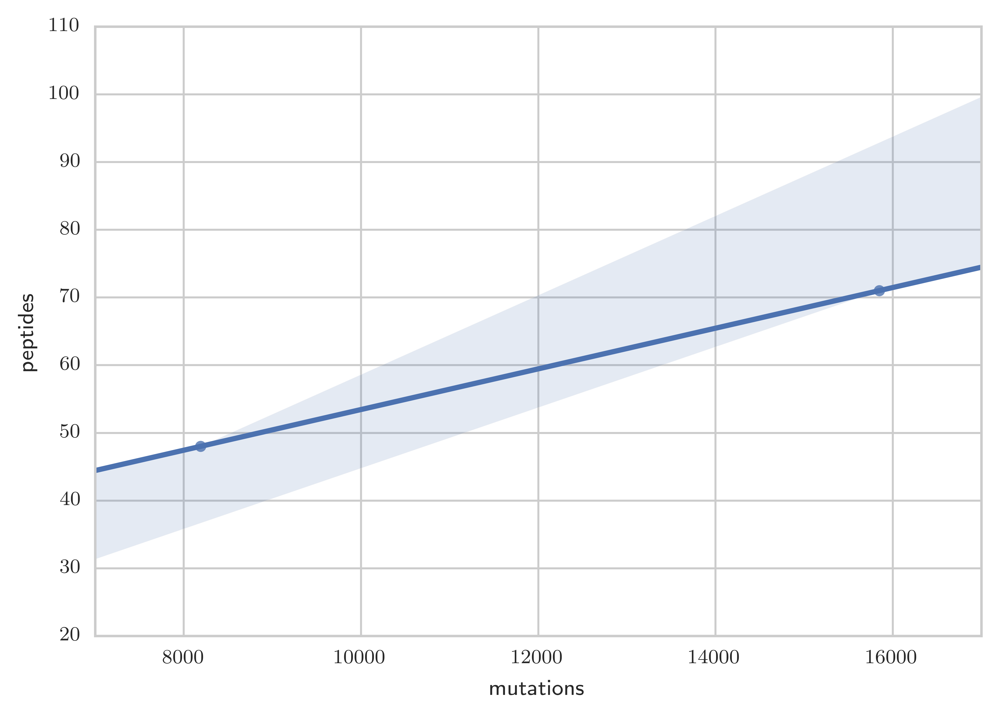

In [534]:
seaborn.regplot(
    data=new_cohort_df.ix[new_cohort_df.donor == "AOCS-092"],
    x="mutations",
    y="peptides")

In [555]:
import scipy.stats

scipy.stats.percentileofscore(df["donor_survival_time"].values, 195)


2.5316455696202533

In [556]:
sorted(new_cohort_df.donor_survival_time)

[133,
 184,
 195,
 195,
 205,
 243,
 286,
 287,
 311,
 320,
 359,
 374,
 393,
 408,
 413,
 423,
 437,
 438,
 477,
 489,
 496,
 511,
 583,
 596,
 597,
 612,
 614,
 616,
 628,
 642,
 642,
 654,
 664,
 673,
 677,
 684,
 689,
 690,
 719,
 734,
 734,
 804,
 804,
 806,
 839,
 839,
 839,
 839,
 843,
 843,
 843,
 886,
 911,
 916,
 916,
 937,
 937,
 937,
 950,
 972,
 1019,
 1039,
 1049,
 1049,
 1055,
 1147,
 1147,
 1162,
 1187,
 1326,
 1326,
 1380,
 1398,
 1398,
 1409,
 1409,
 1421,
 1423,
 1423,
 1430,
 1430,
 1430,
 1527,
 1618,
 1618,
 1639,
 1699,
 1699,
 1727,
 1759,
 1873,
 1883,
 1889,
 1918,
 1972,
 2054,
 2054,
 2101,
 2218,
 2227,
 2341,
 2451,
 2464,
 2644,
 2776,
 2826,
 2879,
 2879,
 2960,
 3193,
 3294,
 3667,
 3787,
 6139]

In [554]:
new_cohort_df.sort_values("mutations", ascending=False)[["source_id", "mutations", "peptides", "expressed peptides", "donor_survival_time"]]

,source_id,mutations,peptides,expressed peptides,donor_survival_time
104,AOCS-166-1-2,38722,418,139,195
14,AOCS-064-3-3,23265,610,227,1398
78,AOCS-139-19-0,20089,479,133,839
94,AOCS-155-3-5,19100,158,101,2826
59,AOCS-120-3-6,18635,306,161,2341
72,AOCS-135-8-X,18150,608,208,1049
30,AOCS-088-3-8,17622,340,153,2879
77,AOCS-139-12-5,17172,403,147,839
39,AOCS-094-1-1,16813,364,134,843
13,AOCS-064-1-6,16697,431,72,1398


In [631]:
# Joint model of both CD8 and Neoantigens

sub_df = new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
        & (new_cohort_df.mutations < 35000)
    
].copy()
sub_df["event"] = sub_df.donor_vital_status == "deceased"
sub_df["log_cellularity"] = numpy.log(sub_df["percentage_cellularity"].fillna(88))

print(sub_df.shape)

fit_df = sub_df[
    ["donor_survival_time", "tumour_stage", "log_cellularity", "CIBERSORT T cells CD8", "peptides", "event"]
].dropna()
print(fit_df.shape)

model2 = lifelines.CoxPHFitter(normalize=True)
model2.fit(
    fit_df,
    'donor_survival_time',
    strata=["tumour_stage"],
    event_col="event")

summary = model2.summary.copy()

for col in ["coef", "lower 0.95", "upper 0.95"]:
    summary["exp(%s)" % col] = numpy.exp(summary[col])
0.72
summary
    


(74, 187)
(73, 6)


,coef,exp(coef),se(coef),z,p,lower 0.95,upper 0.95,exp(lower 0.95),exp(upper 0.95)
log_cellularity,-0.019723,0.980470,0.147258,-0.133935,0.893454,-0.308408,0.268962,0.734616,1.308605
CIBERSORT T cells CD8,-0.486370,0.614854,0.164988,-2.947911,0.003199,-0.809812,-0.162928,0.444942,0.849652
peptides,-0.328543,0.719972,0.151142,-2.173737,0.029725,-0.624841,-0.032245,0.535347,0.968269


In [628]:
model2.print_summary()

n=73, number of events=59

                            coef  exp(coef)  se(coef)          z         p  lower 0.95  upper 0.95    
log_cellularity       -1.972e-02  9.805e-01 1.473e-01 -1.339e-01 8.935e-01  -3.084e-01   2.690e-01    
CIBERSORT T cells CD8 -4.864e-01  6.149e-01 1.650e-01 -2.948e+00 3.199e-03  -8.098e-01  -1.629e-01  **
peptides              -3.285e-01  7.200e-01 1.511e-01 -2.174e+00 2.972e-02  -6.248e-01  -3.225e-02   *
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1 

Concordance = 0.659


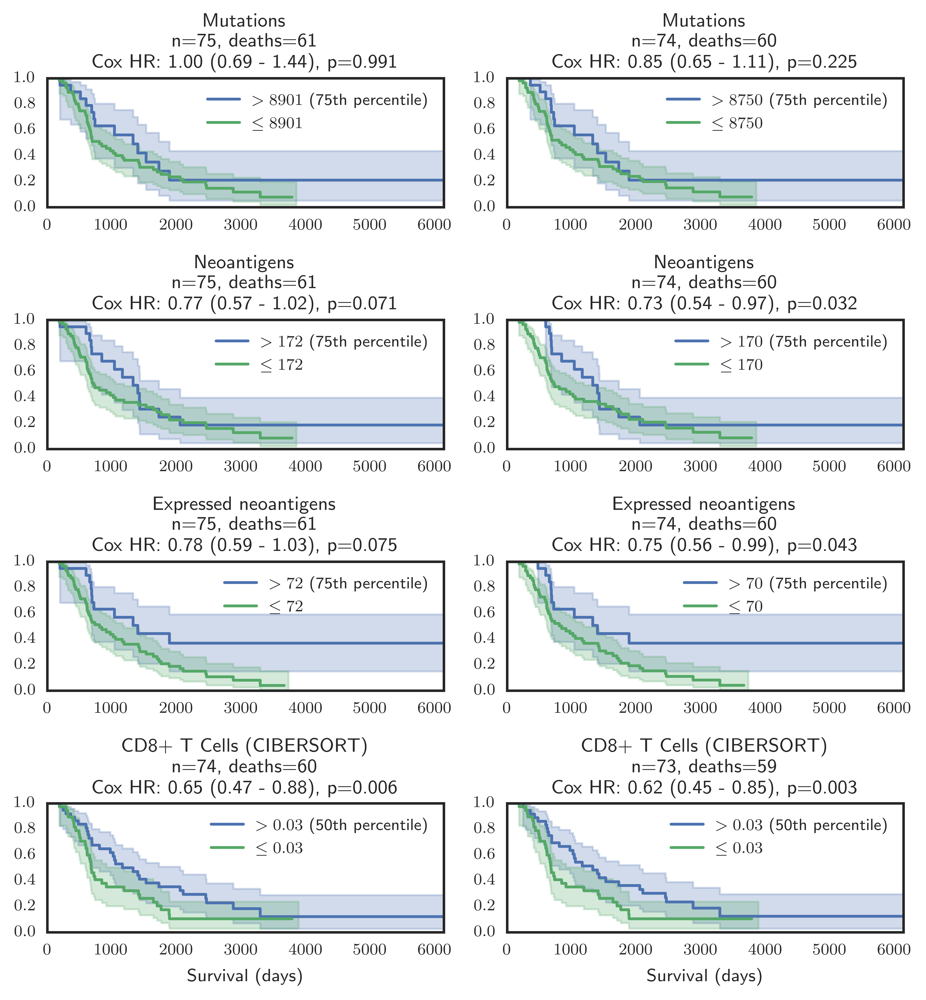

In [558]:
matplotlib.rc('text', usetex=True)

def draw(sub_df, quantity, quantile=0.50, label="$%s %0.0f$ (%dth percentile)", short_label="$%s %0.0f$", transform=None):
    sub_df = sub_df.copy()
    sub_df["event"] = sub_df.donor_vital_status == "deceased"
    threshold = sub_df[quantity].quantile(quantile)
    sub_df["high"] = sub_df[quantity] > threshold
    if transform is None:
        sub_df["quantity"] = sub_df[quantity]
    else:
        sub_df["quantity"] = transform(sub_df[quantity])
    sub_df["log_cellularity"] = numpy.log(sub_df["percentage_cellularity"].fillna(88))



    model = lifelines.KaplanMeierFitter()
    model.fit(
        sub_df.ix[sub_df.high, "donor_survival_time"],
        sub_df.ix[sub_df.high, "event"],
        label=label % (">", threshold, quantile * 100.0))
    ax = model.plot(ax=pyplot.gca())

    model.fit(
        sub_df.ix[~sub_df.high, "donor_survival_time"],
        sub_df.ix[~sub_df.high, "event"],
        label=short_label % ("\\leq", threshold))
    model.plot(ax=pyplot.gca())
    
    fit_df = sub_df[["donor_survival_time", "tumour_stage", "log_cellularity", "quantity", "event"]].ix[
            ~sub_df["quantity"].isnull()
    ]
    
    model2 = lifelines.CoxPHFitter(normalize=True)
    model2.fit(
        fit_df,
        'donor_survival_time',
        strata=["tumour_stage"],
        event_col="event")
    summary = model2.summary
    summary["quantity"] = quantity
    summary["n"] = len(fit_df)
    summary["norm_mean"] = model2._norm_mean
    summary["norm_std"] = model2._norm_std
    
    model3 = lifelines.CoxPHFitter(normalize=False)
    model3.fit(
        fit_df,
        'donor_survival_time',
        strata=["tumour_stage"],
        event_col="event")
    summary3 = model3.summary
    for c in summary3.columns:
        summary["raw %s" % c] = summary3[c]
    
    summary["quantity"] = quantity
    summary["n"] = len(fit_df)
    summary["norm_mean"] = model2._norm_mean
    summary["norm_std"] = model2._norm_std
    summary["events"] = fit_df.event.sum()
    summary["model"] = model2
    return summary

sub_df = new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
].copy()
sub_df["event"] = sub_df.donor_vital_status == "deceased"
sub_df2 = sub_df.ix[sub_df.mutations < 35000]

def make_title(label, summary):
    quantity_summary = summary.ix["quantity"]
    hr = "%0.2f (%0.2f - %0.2f)" % (
        numpy.exp(quantity_summary["coef"]),
        numpy.exp(quantity_summary["lower 0.95"]),
        numpy.exp(quantity_summary["upper 0.95"]),
    )
    pyplot.title(
        "%s\nn=%d, deaths=%d\nCox HR: %s, p=%0.3f" % (
            label,
            summary.n.iloc[0],
            summary.events.iloc[0],
            hr,
            quantity_summary.p))

summaries = []

seaborn.set_style('white')
seaborn.set_context('paper')
pyplot.figure(figsize=(6.5, 7))

pyplot.subplot(421)
summary = draw(sub_df, quantile=0.75, quantity="mutations")
summaries.append(summary)
make_title("Mutations", summary)
pyplot.xlabel("")

pyplot.subplot(422)
summary = draw(sub_df2, quantile=0.75, quantity="mutations")
summaries.append(summary)
make_title("Mutations", summary)
pyplot.xlabel("")

pyplot.subplot(423)
summary = draw(sub_df, quantile=0.75, quantity="peptides")
summaries.append(summary)
pyplot.title("Neoantigens\np=%0.3f" % summary.ix["quantity"].p)
make_title("Neoantigens", summary)
pyplot.xlabel("")

pyplot.subplot(424)
summary = draw(sub_df2, quantile=0.75, quantity="peptides")
summaries.append(summary)
pyplot.title("Neoantigens\np=%0.3f" % summary.ix["quantity"].p)
make_title("Neoantigens", summary)
pyplot.xlabel("")

pyplot.subplot(425)
summary = draw(sub_df, quantile=0.75, quantity="expressed peptides")
summaries.append(summary)
make_title("Expressed neoantigens", summary)
pyplot.xlabel("")

pyplot.subplot(426)
summary = draw(sub_df2, quantile=0.75, quantity="expressed peptides")
summaries.append(summary)
make_title("Expressed neoantigens", summary)
pyplot.xlabel("")

pyplot.subplot(427)
summary = draw(sub_df, "CIBERSORT T cells CD8", quantile=0.5, short_label="$%s %0.2f$", label="$%s %0.2f$ (%dth percentile)")
summaries.append(summary)
make_title("CD8+ T Cells (CIBERSORT)", summary)
pyplot.xlabel("Survival (days)")

pyplot.subplot(428)
summary = draw(sub_df2, "CIBERSORT T cells CD8", quantile=0.5, short_label="$%s %0.2f$", label="$%s %0.2f$ (%dth percentile)")
summaries.append(summary)
make_title("CD8+ T Cells (CIBERSORT)", summary)
pyplot.xlabel("Survival (days)")
pyplot.tight_layout()

summary_df = pandas.concat([x.reset_index() for x in summaries], ignore_index=True)
summary_df

pyplot.savefig("../figures/survival.pdf")



In [541]:
# Time since last chemo
df = new_cohort_df.ix[new_cohort_df.specific_treatment == "primary/untreated"].copy()
#seaborn.regplot(
#    data=df,
#    x="days since last chemo",
#    y="mutations",
#)

df["field"] = df["peptides"]
#df["field"] = df["chemo mutations"] * df.mutations


# regression
import statsmodels.api as sm
model = sm.OLS(df["field"], sm.add_constant(df[["mutations"]]))
res = model.fit()
print(res.summary(alpha=0.1))

print(scipy.stats.pearsonr(df.field.values, df["mutations"].values)[0])

                            OLS Regression Results                            
Dep. Variable:                  field   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     80.00
Date:                Tue, 20 Jun 2017   Prob (F-statistic):           1.53e-13
Time:                        15:49:53   Log-Likelihood:                -446.38
No. Observations:                  79   AIC:                             896.8
Df Residuals:                      77   BIC:                             901.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const         30.1280     15.577      1.934      0.0

In [390]:
num = 5
item = summary_df.ix[
    (summary_df["index"] == "quantity") &
    (summary_df["quantity"] == "expressed peptides")
].iloc[1]

print(
    "Protective effect of %d additional expressed neoantigens: %0.3f%% (%0.3f - %0.3f)" % (
            num,
            100.0 * (1 - numpy.exp(item["raw coef"] * num)),
            100.0 * (1 - numpy.exp(item["raw upper 0.95"] * num)),
            100.0 * (1 - numpy.exp(item["raw lower 0.95"] * num))))
        
num = 9
item = summary_df.ix[
    (summary_df["index"] == "quantity") &
    (summary_df["quantity"] == "peptides")
].iloc[1]

print(
    "Protective effect of %d additional neoantigens: %0.3f%% (%0.3f - %0.3f)" % (
            num,
            100.0 * (1 - numpy.exp(item["raw coef"] * num)),
            100.0 * (1 - numpy.exp(item["raw upper 0.95"] * num)),
            100.0 * (1 - numpy.exp(item["raw lower 0.95"] * num))))
        

Protective effect of 5 additional expressed neoantigens: 3.686% (0.119 - 7.126)
Protective effect of 9 additional neoantigens: 2.964% (0.263 - 5.593)


In [407]:
pt_df = new_cohort_df.ix[
    (new_cohort_df.donor == "AOCS-092") & (new_cohort_df.specific_treatment == "primary/untreated")
].copy()
pt_df["log_cellularity"] = numpy.log(pt_df.percentage_cellularity)
pt_df["quantity"] = pt_df["peptides"]
pt_df = pt_df[["tumour_stage", "log_cellularity", "quantity"]].reset_index()

pt_df2 = pt_df.copy()
pt_df2["quantity"] += 9

item.model.predict_expectation(pt_df)[0] - item.model.predict_expectation(pt_df2)[0]


0   -36.518453
Name: 0, dtype: float64

In [408]:
pt_df2

,index,tumour_stage,log_cellularity,quantity
0,34,III,4.418841,57


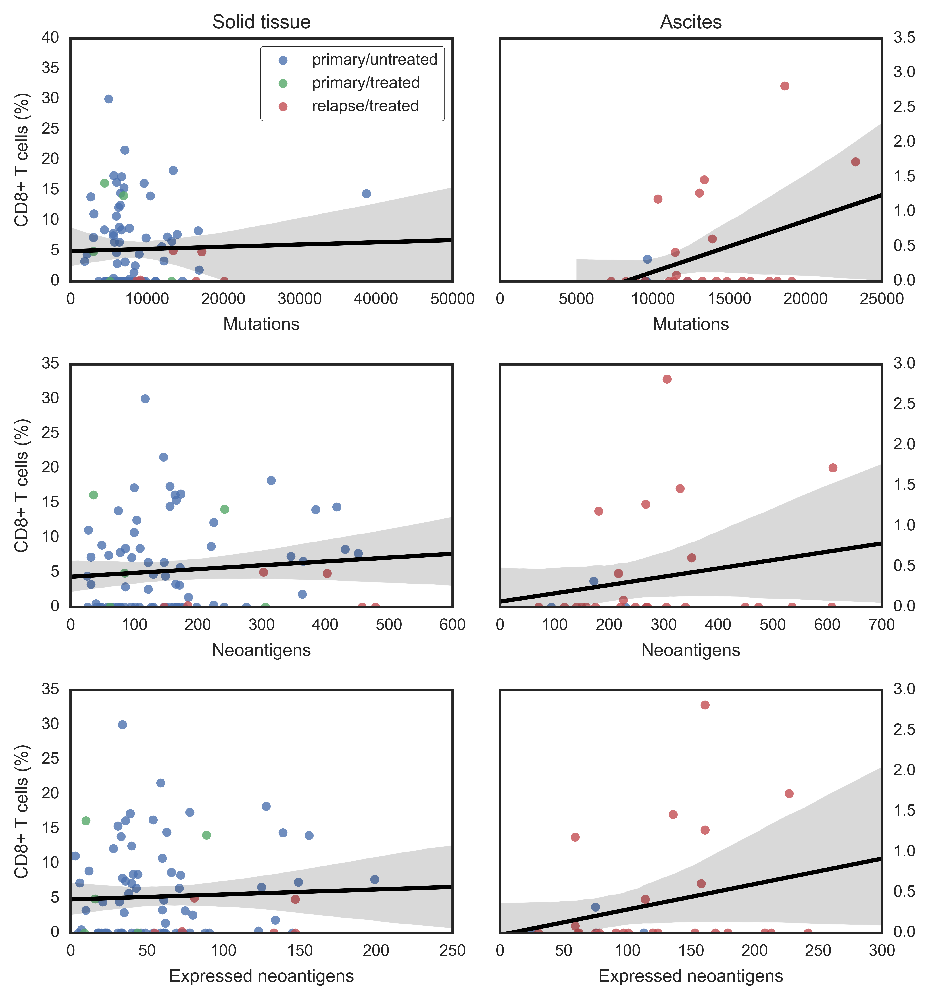

In [639]:
seaborn.set_style('white')
seaborn.set_context('paper')
pyplot.figure(figsize=(6.5, 7))

matplotlib.rc('text', usetex=False)

colors = seaborn.palettes.get_color_cycle()

treatments = ["primary/untreated", "primary/treated", "relapse/treated"]
treatment_to_color = dict(zip(treatments, colors))

def make_plot(x, y, sub_df):
    sub_df = sub_df.copy()
    sub_df[y] = sub_df[y] * 100.0
    for specific_treatment in treatments:
        sub_df2 = sub_df.ix[sub_df.specific_treatment == specific_treatment]
        if len(sub_df2):
            seaborn.regplot(
                data=sub_df2,
                x=x,
                y=y,
                label=specific_treatment,
                ci=False,
                fit_reg=False,
                color=treatment_to_color[specific_treatment])
    seaborn.regplot(data=sub_df, x=x, y=y, scatter=False, color='black')
    #seaborn.regplot(data=sub_df.ix[sub_df[y] > 0], x=x, y=y, scatter=False, color='orange')
        
    pyplot.ylim(ymin=0)
    pyplot.xlim(xmin=0)

pyplot.subplot(321)
make_plot(
    "mutations",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "solid")
    ])
pyplot.title("Solid tissue")
pyplot.legend(frameon=True, fancybox=True)
pyplot.xlabel("Mutations")
pyplot.ylabel("CD8+ T cells (%)")


pyplot.subplot(322)
make_plot(
    "mutations",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "ascites")
    ])
pyplot.title("Ascites")
pyplot.ylabel("")
pyplot.gca().yaxis.tick_right()
pyplot.tight_layout()
pyplot.xlabel("Mutations")



pyplot.subplot(323)
make_plot(
    "peptides",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "solid")
    ])
pyplot.xlabel("Neoantigens")
pyplot.ylabel("CD8+ T cells (%)")


pyplot.subplot(324)
make_plot(
    "peptides",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "ascites")
    ])
pyplot.ylabel("")
pyplot.gca().yaxis.tick_right()
pyplot.tight_layout()
pyplot.xlabel("Neoantigens")


pyplot.subplot(325)
make_plot(
    "expressed peptides",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "solid")
    ])
pyplot.xlabel("Expressed neoantigens")
pyplot.ylabel("CD8+ T cells (%)")

pyplot.subplot(326)
make_plot(
    "expressed peptides",
    "CIBERSORT T cells CD8",
    new_cohort_df.ix[
        (new_cohort_df.tissue_type == "ascites")
    ])
pyplot.ylabel("")
pyplot.gca().yaxis.tick_right()
pyplot.tight_layout()
pyplot.xlabel("Expressed neoantigens")

pyplot.savefig("../figures/cd8_vs_muts.pdf")

1

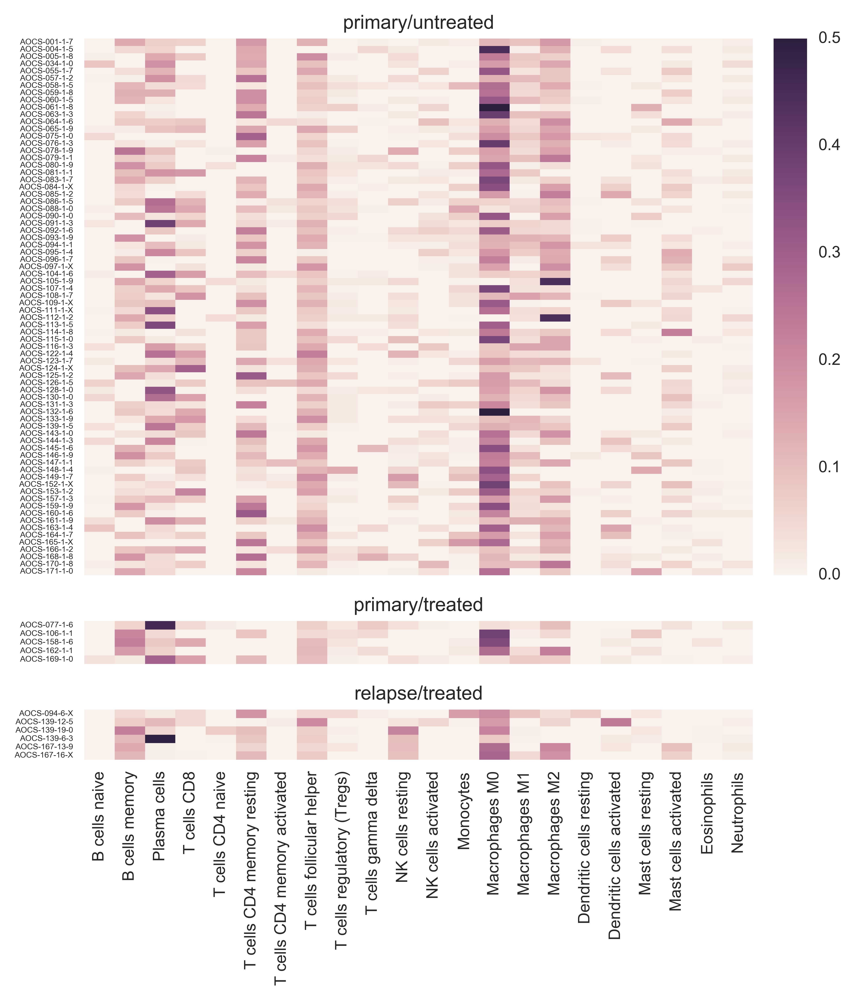

In [575]:
matplotlib.rc('text', usetex=False)
import matplotlib.gridspec as gridspec


sub_df = new_cohort_df.ix[
        (new_cohort_df.tissue_type == "solid")
    & (~new_cohort_df["CIBERSORT B cells naive"].isnull())
].copy()
sub_df.index = sub_df.source_id

seaborn.set_style('white')
seaborn.set_context('paper')
fig = pyplot.figure(figsize=(6.0, 7))

gs = gridspec.GridSpec(3, 2, height_ratios=[75,6,5 + 2], width_ratios=[1, .05])

for (i, treatment) in enumerate(treatments):
    heat_df = sub_df.ix[
        sub_df.specific_treatment == treatment
    ].copy()
    
    heat_df = heat_df[[
        c for c
        in heat_df.columns
        if c.startswith("CIBERSORT") and "RMSE" not in c and "Correlation" not in c and "value" not in c and c != "CIBERSORT T cells"
    ]]
    heat_df.columns = [
        c.replace("CIBERSORT", "").strip()
        for c in heat_df.columns
    ]

    ax2 = pyplot.subplot(gs[i, 1])
    if i != 0:
        fig.delaxes(ax2)
    ax = pyplot.subplot(gs[i, 0])
    seaborn.heatmap(heat_df, vmax=0.5, cbar=i == 0, cbar_ax=ax2 if i == 0 else None)
    if i == 2:
        #ax.xaxis.tick_top()
        #pyplot.xticks(rotation=90)
        pass
    else:
        pyplot.xticks([])
    pyplot.title(treatment)
    pyplot.ylabel("")
    pyplot.yticks(fontsize=4)

#pyplot.suptitle("Solid tissue", x=0.8)
pyplot.tight_layout()

pyplot.savefig("../figures/cibersort_heatmap_solid.pdf")

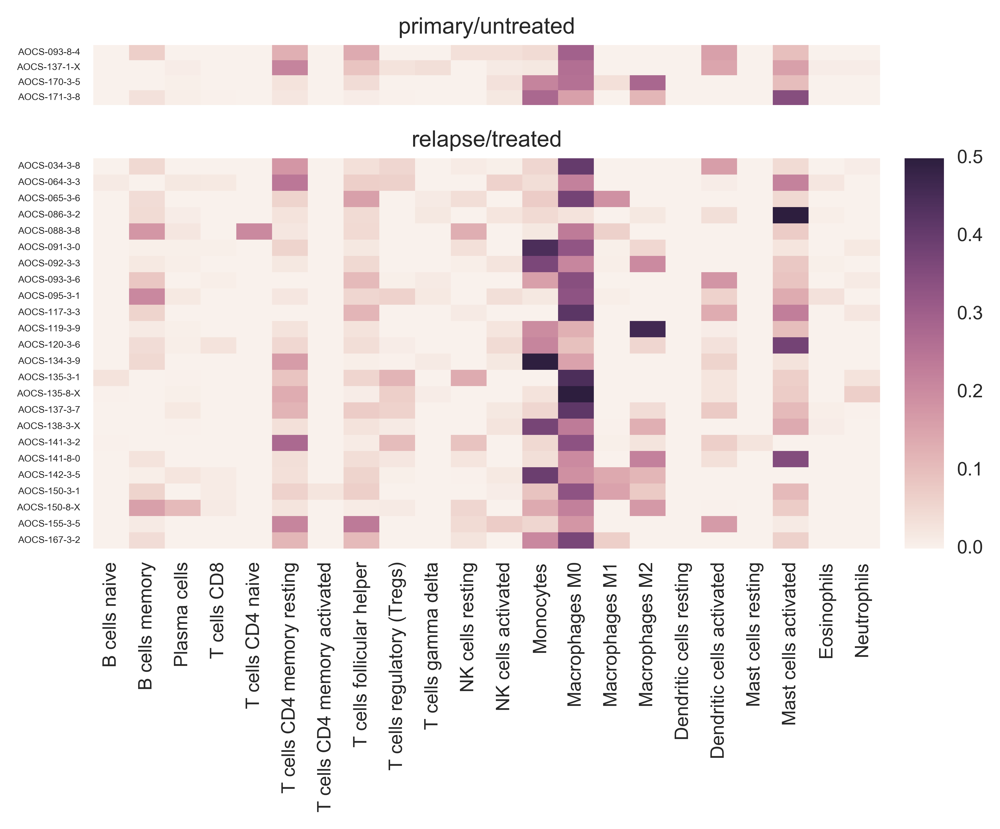

In [578]:
matplotlib.rc('text', usetex=False)
import matplotlib.gridspec as gridspec


sub_df = new_cohort_df.ix[
        (new_cohort_df.tissue_type == "ascites")
].copy()
sub_df.index = sub_df.source_id

seaborn.set_style('white')
seaborn.set_context('paper')
fig = pyplot.figure(figsize=(6.0, 5.0))

gs = gridspec.GridSpec(2, 2, height_ratios=[4,24 + 2], width_ratios=[1, .05])

for (i, treatment) in enumerate(["primary/untreated", "relapse/treated"]):
    heat_df = sub_df.ix[
        sub_df.specific_treatment == treatment
    ].copy()
    
    heat_df = heat_df[[
        c for c
        in heat_df.columns
        if c.startswith("CIBERSORT") and "RMSE" not in c and "Correlation" not in c and "value" not in c and c != "CIBERSORT T cells"
    ]]
    heat_df.columns = [
        c.replace("CIBERSORT", "").strip()
        for c in heat_df.columns
    ]

    ax2 = pyplot.subplot(gs[i, 1])
    if i != 1:
        fig.delaxes(ax2)
    ax = pyplot.subplot(gs[i, 0])
    seaborn.heatmap(heat_df, vmax=0.5, cbar=i == 1, cbar_ax=ax2 if i == 1 else None)
    if i != 1:
        pyplot.xticks([])
    pyplot.title(treatment)
    pyplot.ylabel("")
    pyplot.yticks(fontsize=4)

#pyplot.suptitle("Solid tissue", x=0.8)
pyplot.tight_layout()
pyplot.savefig("../figures/cibersort_heatmap_ascites.pdf")

In [594]:
cibersort_cols = [
    x for x in new_cohort_df.columns
    if 'CIBERSORT' in x and x != "CIBERSORT T cells" and "RMSE" not in x and "P-value" not in x and "Correlation" not in x
]
cibersort_cols

['CIBERSORT B cells naive',
 'CIBERSORT B cells memory',
 'CIBERSORT Plasma cells',
 'CIBERSORT T cells CD8',
 'CIBERSORT T cells CD4 naive',
 'CIBERSORT T cells CD4 memory resting',
 'CIBERSORT T cells CD4 memory activated',
 'CIBERSORT T cells follicular helper',
 'CIBERSORT T cells regulatory (Tregs)',
 'CIBERSORT T cells gamma delta',
 'CIBERSORT NK cells resting',
 'CIBERSORT NK cells activated',
 'CIBERSORT Monocytes',
 'CIBERSORT Macrophages M0',
 'CIBERSORT Macrophages M1',
 'CIBERSORT Macrophages M2',
 'CIBERSORT Dendritic cells resting',
 'CIBERSORT Dendritic cells activated',
 'CIBERSORT Mast cells resting',
 'CIBERSORT Mast cells activated',
 'CIBERSORT Eosinophils',
 'CIBERSORT Neutrophils']

In [600]:
df = new_cohort_df.ix[~new_cohort_df[cibersort_cols[0]].isnull()].copy()
df.index = [
    "%s %s %s" % (row.source_id, row.specific_treatment, row.tissue_type)
    for _, row in df.iterrows()
]
df = df[cibersort_cols]
df.columns = [x.replace("CIBERSORT", "").strip() for x in df.columns]

In [601]:
cg = seaborn.clustermap(df, figsize=(10, 15), metric="cosine")
x = pyplot.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=4)


In [616]:
new_cohort_df[cibersort_cols].sum(1)

0      1.0
1      1.0
2      1.0
3      1.0
4      1.0
5      1.0
6      0.0
7      1.0
8      1.0
9      1.0
10     1.0
11     1.0
12     1.0
13     1.0
14     1.0
15     1.0
16     1.0
17     1.0
18     1.0
19     1.0
20     1.0
21     1.0
22     1.0
23     1.0
24     1.0
      ... 
89     1.0
90     1.0
91     1.0
92     1.0
93     1.0
94     1.0
95     1.0
96     1.0
97     1.0
98     1.0
99     1.0
100    1.0
101    1.0
102    1.0
103    1.0
104    1.0
105    1.0
106    1.0
107    1.0
108    1.0
109    1.0
110    1.0
111    1.0
112    1.0
113    1.0
dtype: float64

In [615]:
sub_df = new_cohort_df.ix[new_cohort_df.tissue_type == "ascites"]
summary_df = sub_df[cibersort_cols].median(0).sort_values(ascending=False).to_frame()
summary_df.columns = ['median']
summary_df['min'] = sub_df[cibersort_cols].min(0).sort_values(ascending=False).to_frame()
summary_df['max'] = sub_df[cibersort_cols].max(0).sort_values(ascending=False).to_frame()
summary_df *= 100.0

summary_df


,median,min,max
CIBERSORT Macrophages M0,26.015720,3.011784,56.931561
CIBERSORT Mast cells activated,9.168404,0.000000,68.853107
CIBERSORT Monocytes,6.435566,0.000000,49.738528
CIBERSORT T cells CD4 memory resting,5.461988,0.000000,27.707823
CIBERSORT T cells follicular helper,4.836334,0.745313,23.903118
CIBERSORT B cells memory,3.040688,0.000000,20.568753
CIBERSORT Dendritic cells activated,2.431498,0.000000,18.107960
CIBERSORT NK cells activated,1.504814,0.000000,7.386844
CIBERSORT Macrophages M2,1.062134,0.000000,46.103814
CIBERSORT Plasma cells,0.460134,0.000000,10.720142


In [614]:
sub_df = new_cohort_df.ix[new_cohort_df.tissue_type == "solid"]
summary_df = sub_df[cibersort_cols].median(0).sort_values(ascending=False).to_frame()
summary_df.columns = ['median']
summary_df['min'] = sub_df[cibersort_cols].min(0).sort_values(ascending=False).to_frame()
summary_df['max'] = sub_df[cibersort_cols].max(0).sort_values(ascending=False).to_frame()
summary_df *= 100.0
summary_df


,median,min,max
CIBERSORT Macrophages M0,21.719147,0.0,54.122697
CIBERSORT T cells follicular helper,9.551855,0.0,23.015249
CIBERSORT Macrophages M2,9.247980,0.0,44.260308
CIBERSORT T cells CD4 memory resting,8.860009,0.0,31.374803
CIBERSORT B cells memory,6.921398,0.0,25.178199
CIBERSORT Plasma cells,5.675465,0.0,49.588866
CIBERSORT Macrophages M1,4.362981,0.0,15.352786
CIBERSORT T cells CD8,2.934093,0.0,30.028979
CIBERSORT Mast cells activated,1.684276,0.0,22.962263
CIBERSORT NK cells resting,0.964436,0.0,21.503824


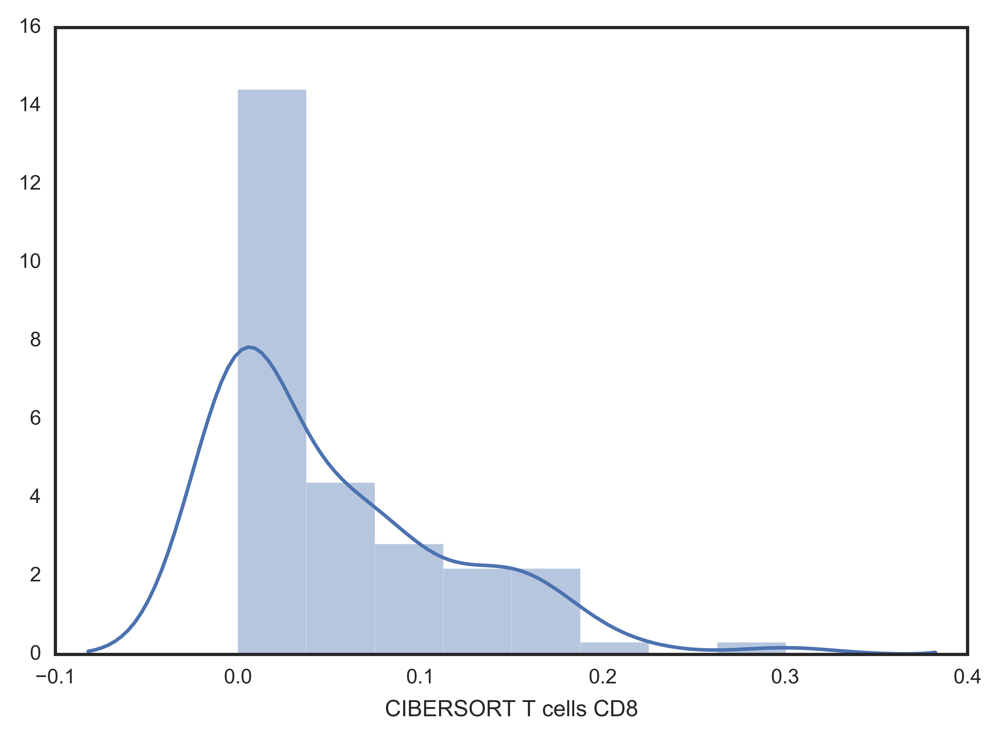

In [618]:
seaborn.distplot(new_cohort_df.ix[new_cohort_df.tissue_type == "solid"]["CIBERSORT T cells CD8"].dropna())

In [619]:
len(cibersort_cols)

22

In [328]:
[x for x in new_cohort_df.columns.tolist() if 'gallus' in x.lower()]

['Cisplatin Gallus gallus mutations',
 'Cisplatin Gallus gallus neoantigens',
 'Cisplatin Gallus gallus expressed neoantigens',
 'Cyclophosphamide Gallus gallus mutations',
 'Cyclophosphamide Gallus gallus neoantigens',
 'Cyclophosphamide Gallus gallus expressed neoantigens',
 'Etoposide Gallus gallus mutations',
 'Etoposide Gallus gallus neoantigens',
 'Etoposide Gallus gallus expressed neoantigens']

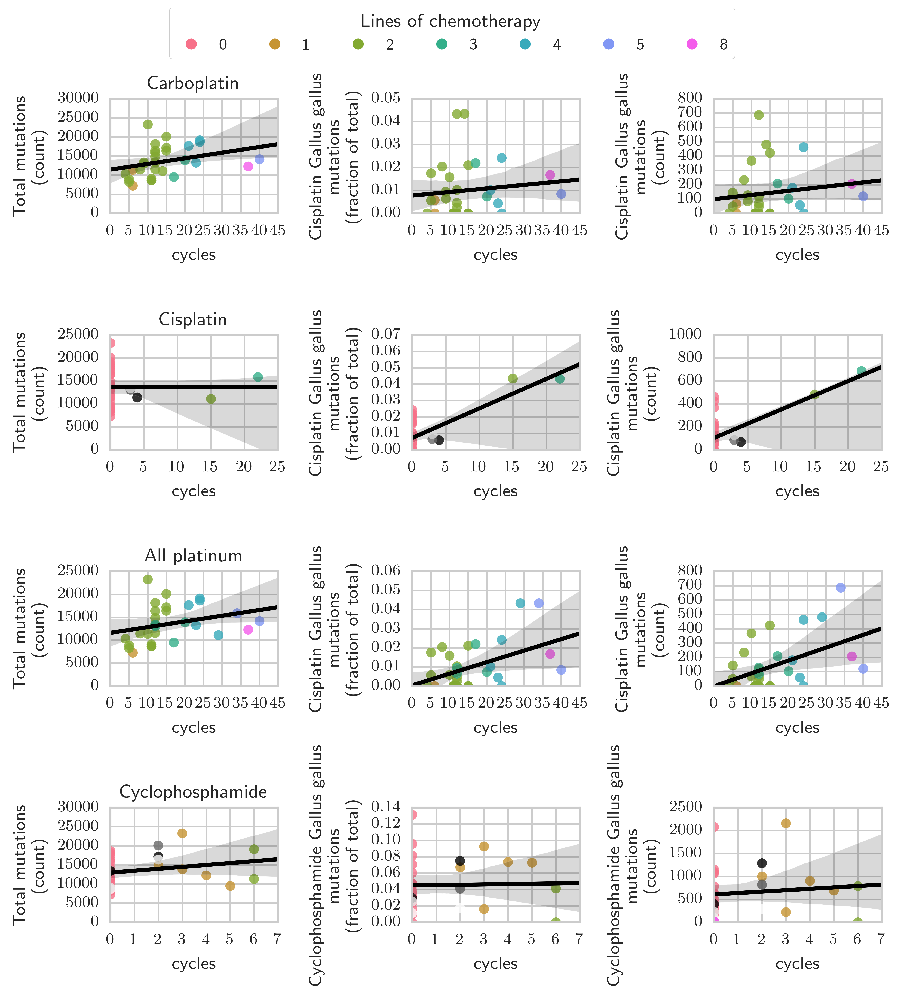

In [512]:
#[x for x in new_cohort_df.columns if 'neoantigens' in x.lower()]

chemo_signatures = [
    "Cisplatin Gallus gallus",
    "Cyclophosphamide Gallus gallus",
    "Etoposide Gallus gallus",
    "Cisplatin C Elegans"
]
quantities = ["mutations", "neoantigens", "expressed neoantigens"]

for quantity in quantities:
    new_cohort_df["chemo %s" % quantity] = new_cohort_df[
        ["%s %s" % (chemo, quantity) for chemo in chemo_signatures]
    ].sum(1)
new_cohort_df


sub_cohort_df = new_cohort_df.ix[new_cohort_df.specific_treatment == "relapse/treated"].copy()

stacked = sub_cohort_df[[
        x for x in chemo_line_cols if sub_cohort_df[x].nunique() > 1 and x.startswith("Lines of")
]].fillna(0).stack().to_frame().reset_index()

stacked.columns = ["source_id", "chemo", "lines"]
stacked["chemo"] = stacked.chemo.str.replace("Lines of ", "")
stacked["lines"] = stacked["lines"].map(
    lambda s: {0.0: "None", 0.5: "< 1"}.get(s, maybe_int(s)))

for chemo_signature in chemo_signatures:
    for quantity in quantities:
        stacked["%s %s" % (chemo_signature, quantity)] = [
            new_cohort_df.ix[row.source_id, "%s %s" % (chemo_signature, quantity)]
            for _, row in stacked.iterrows()
        ]
    stacked["%s mutations num" % (chemo_signature,)] = [
            new_cohort_df.ix[
                row.source_id,
                "%s mutations" % (chemo_signature,)
            ] *  new_cohort_df.ix[row.source_id, "mutations"]
            for _, row in stacked.iterrows()
    ]

stacked["cycles"] = [
    new_cohort_df.ix[row.source_id, "Cycles of %s" % row.chemo]
    for _, row in stacked.iterrows()
]
stacked["chemo expressed peptides rate"] = [
    new_cohort_df.ix[row.source_id, "chemo expressed neoantigens"]
    for _, row in stacked.iterrows()
]
stacked["chemo peptides rate"] = [
    new_cohort_df.ix[row.source_id, "chemo neoantigens"]
    for _, row in stacked.iterrows()
]
stacked["chemo mutations rate"] = [
    new_cohort_df.ix[row.source_id, "chemo mutations"]
    for _, row in stacked.iterrows()
]
stacked["mutations"] = [
    new_cohort_df.ix[row.source_id, "mutations"]
    for _, row in stacked.iterrows()
]

stacked["expressed peptides"] = [
    new_cohort_df.ix[row.source_id, "expressed peptides"]
    for _, row in stacked.iterrows()
]
stacked["peptides"] = [
    new_cohort_df.ix[row.source_id, "peptides"]
    for _, row in stacked.iterrows()
]

stacked["mutations"] = [
    new_cohort_df.ix[row.source_id, "mutations"]
    for _, row in stacked.iterrows()
]

stacked["chemo expressed peptides"] = stacked["chemo expressed peptides rate"] * stacked["expressed peptides"]
stacked["chemo peptides"] = stacked["chemo peptides rate"] * stacked["peptides"]
stacked["chemo mutations"] = stacked["chemo mutations rate"] * stacked["mutations"]


for y_col in ["mutations_per_mb", "peptides", "expressed peptides", "tissue_type"]:
    stacked[y_col] = stacked.source_id.map(new_cohort_df[y_col])

stacked["chemo mutations per mb"] = stacked["chemo mutations"] / library_sizes["WGS"]

stacked["lines"] = stacked.lines.replace("None", "0").astype(int)



seaborn.set_context('paper')
seaborn.set_style('whitegrid')

lines_to_color = collections.OrderedDict(
    zip(sorted(stacked.lines.unique()), seaborn.palettes.husl_palette(stacked.lines.nunique())))
lines_to_color
#del lines_to_color[0]

def draw(chemo, **kwargs):
    for lines, sub_df2 in stacked.ix[(stacked.chemo == chemo)].groupby("lines"):
        for tissue_type, sub_df in sub_df2.groupby("tissue_type"):
            seaborn.regplot(
                fit_reg=False,
                data=sub_df,
                scatter_kws={
                    's':25,
                    'c': lines_to_color[lines],
                    'marker': "+" if tissue_type == "solid" else "o",
                },
                **kwargs)
    seaborn.regplot(
        data=stacked.ix[(stacked.chemo == chemo)],
        scatter=False,
        color="black",
        #robust=True,
        **kwargs
    )
    pyplot.ylim(ymin=0)
    pyplot.xlim(xmin=0)

pyplot.figure(figsize=(6.5,7))
chemos = ["carboplatin", "cisplatin", "platinum",  "cyclophosphamide"]
for (row, chemo) in enumerate(chemos):
    pyplot.subplot(len(chemos),3,1 + 3 * row)
    draw(chemo, x="cycles", y="mutations")
    #if row == 0:
    #    pyplot.legend(
    #        title="Lines of chemo",
    #        ncol=6,
    #        fancybox=True,
    #        frameon=True,
    #        loc="upper right",
    #        fontsize="small",
    #        bbox_to_anchor=(4,1.35))
    pyplot.ylabel("Total mutations\n(count)")
    if chemo == 'platinum':
        pyplot.title("All platinum")
    else:
        pyplot.title(chemo.title())
    
    if 'plat' in chemo:
        signature = "Cisplatin Gallus gallus"
    elif 'cyclo' in chemo:
        signature = "Cyclophosphamide Gallus gallus"
    else:
        raise chemo

    pyplot.subplot(len(chemos),3,2 + 3 * row)
    draw(chemo, x="cycles", y="%s mutations" % signature)
    pyplot.ylabel("%s\nmutations\n(fraction of total)" % signature)

    #pyplot.gca().yaxis.set_label_position("right")

    pyplot.subplot(len(chemos),3,3 + 3 * row)
    draw(chemo, x="cycles", y="%s mutations num" % signature)
    pyplot.ylabel("%s\nmutations\n(count)" % signature)
    #pyplot.gca().yaxis.tick_right()
    #pyplot.gca().yaxis.set_label_position("right")

legend_handles = []
legend_labels = []
for (label, color) in lines_to_color.items():
    legend_handles.extend(pyplot.plot([0], [0], label=label, color=color, marker='o', ls='None'))
    legend_labels.append(label)

pyplot.figlegend(
    legend_handles,
    legend_labels,
    "upper center",
    title="Lines of chemotherapy",
    ncol=7,
    fancybox=True,
    frameon=True,
    fontsize="small")
pyplot.tight_layout(rect=(0, 0, 1, .95))

pyplot.savefig("../figures/chemo_cycles_and_mutations.pdf")
#!open ../figures/chemo_cycles_and_mutations.pdf

In [525]:
# Time since last chemo
df = new_cohort_df.ix[new_cohort_df.specific_treatment == "relapse/treated"].copy()
#seaborn.regplot(
#    data=df,
#    x="days since last chemo",
#    y="mutations",
#)

df["field"] = df["mutations"]
#df["field"] = df["chemo mutations"] * df.mutations


# regression
import statsmodels.api as sm
model = sm.OLS(df["field"], sm.add_constant(df[["days since last chemo", "total cycles"]]))
res = model.fit()
print(res.summary(alpha=0.1))

print(scipy.stats.pearsonr(df.field.values, df["days since last chemo"].values)[0])

                            OLS Regression Results                            
Dep. Variable:                  field   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     1.837
Date:                Tue, 20 Jun 2017   Prob (F-statistic):              0.179
Time:                        12:09:32   Log-Likelihood:                -289.28
No. Observations:                  30   AIC:                             584.6
Df Residuals:                      27   BIC:                             588.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|       [0.05       0.95]
-----------------------------------------------------------------------------------------
const                  1.342e+

In [519]:
df["field"]

4      0.062105
14     0.117842
16     0.037462
28     0.102063
30     0.070569
33     0.130625
35     0.209371
37     0.034688
40     0.030655
42     0.120636
57     0.090371
58     0.049719
59     0.038641
70     0.014390
71     0.034498
72     0.038205
74     0.084712
75     0.106095
77     0.087388
78     0.061844
79     0.021539
80     0.040996
81     0.062905
82     0.000000
90     0.085265
91     0.074421
94     0.075964
105    0.017409
106    0.040294
107    0.045023
Name: field, dtype: float64

                            OLS Regression Results                            
Dep. Variable:              mutations   R-squared:                       0.127
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     1.969
Date:                Tue, 20 Jun 2017   Prob (F-statistic):              0.159
Time:                        10:26:38   Log-Likelihood:                -289.15
No. Observations:                  30   AIC:                             584.3
Df Residuals:                      27   BIC:                             588.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const       1.248e+04   1624.041      7.686      0.0

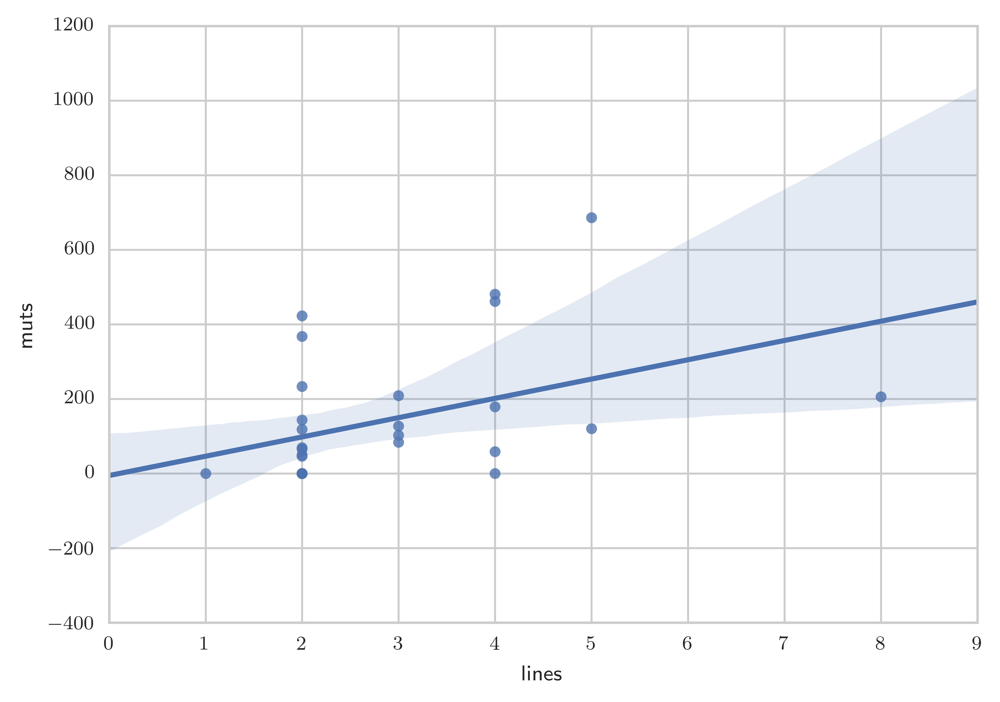

In [507]:
df = new_cohort_df.ix[
    new_cohort_df.specific_treatment == "relapse/treated"
    
][["Cisplatin Gallus gallus mutations", "Cycles of platinum", "Lines of platinum", "mutations"]]

df.columns = ["frac", "cycles", "lines", "mutations"]
df["percent"] = df.frac * 100.0
df["muts"] = df["frac"] * df["mutations"]

# regression
import statsmodels.api as sm
model = sm.OLS(df.mutations, sm.add_constant(df[["cycles", "lines"]]))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 
print(scipy.stats.pearsonr(df.muts.values, df.cycles.values)[0])

seaborn.regplot(data=df, x="lines", y="muts")

                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     2.150
Date:                Tue, 20 Jun 2017   Prob (F-statistic):              0.154
Time:                        14:15:35   Log-Likelihood:                -71.274
No. Observations:                  30   AIC:                             146.5
Df Residuals:                      28   BIC:                             149.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const          1.0730      0.985      1.089      0.2

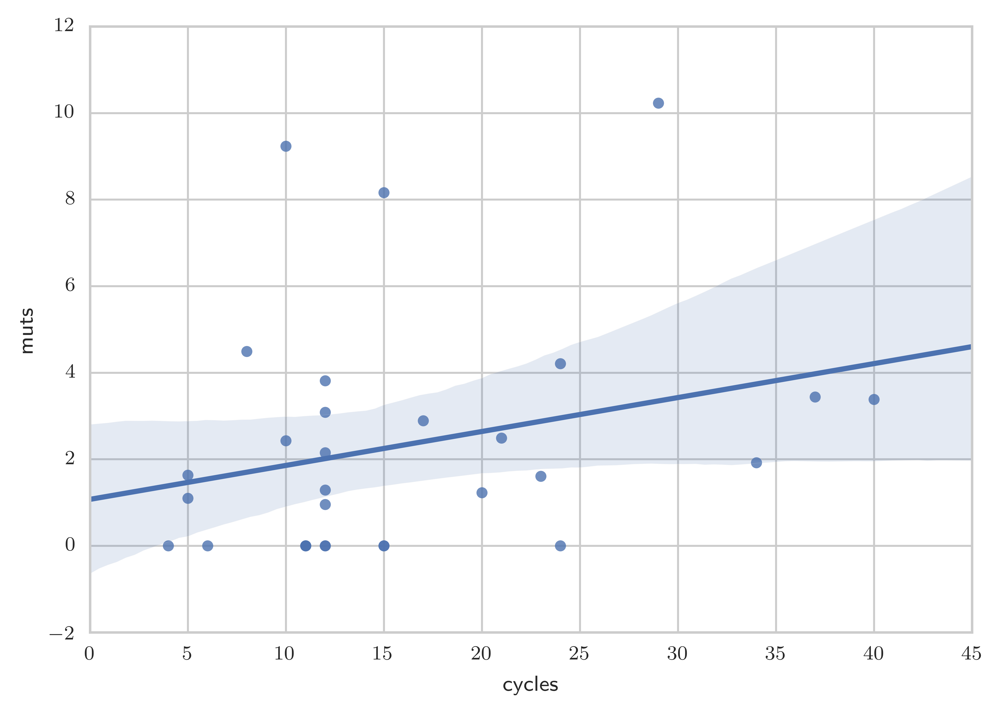

In [530]:
# Expressed neoantigens

df = new_cohort_df.ix[
    new_cohort_df.specific_treatment == "relapse/treated"
    
][["Cisplatin Gallus gallus neoantigens", "Cycles of platinum", "peptides"]]

df.columns = ["frac", "cycles", "mutations"]
df["percent"] = df.frac * 100.0
df["muts"] = df["frac"] * df["mutations"]

# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 
print(scipy.stats.pearsonr(df.muts.values, df.cycles.values)[0])

seaborn.regplot(data=df, x="cycles", y="muts")

In [531]:
df

,frac,cycles,mutations,percent,muts
4,0.006002,23.0,268,0.600213,1.608570
14,0.015138,10.0,610,1.513785,9.234091
16,0.000000,6.0,118,0.000000,0.000000
28,0.007535,40.0,449,0.753513,3.383271
30,0.007329,21.0,340,0.732870,2.491759
33,0.020706,8.0,217,2.070599,4.493200
35,0.027080,34.0,71,2.708041,1.922709
37,0.003494,20.0,351,0.349376,1.226311
40,0.000000,12.0,303,0.000000,0.000000
42,0.037887,29.0,270,3.788738,10.229593


                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     8.144
Date:                Tue, 20 Jun 2017   Prob (F-statistic):            0.00804
Time:                        14:14:09   Log-Likelihood:                -193.45
No. Observations:                  30   AIC:                             390.9
Df Residuals:                      28   BIC:                             393.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const         -1.9867     57.848     -0.034      0.9

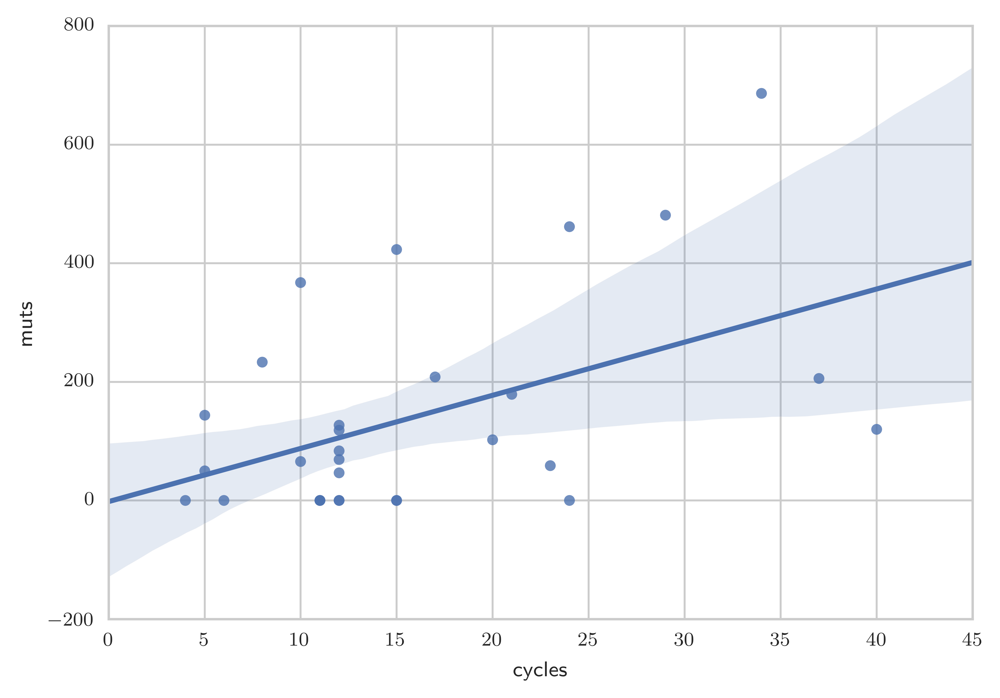

In [526]:
df = new_cohort_df.ix[
    new_cohort_df.specific_treatment == "relapse/treated"
    
][["Cisplatin Gallus gallus mutations", "Cycles of platinum", "mutations"]]

df.columns = ["frac", "cycles", "mutations"]
df["percent"] = df.frac * 100.0
df["muts"] = df["frac"] * df["mutations"]

# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 
print(scipy.stats.pearsonr(df.muts.values, df.cycles.values)[0])

seaborn.regplot(data=df, x="cycles", y="muts")

                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     1.419
Date:                Tue, 20 Jun 2017   Prob (F-statistic):              0.246
Time:                        09:55:53   Log-Likelihood:                -157.51
No. Observations:                  25   AIC:                             319.0
Df Residuals:                      23   BIC:                             321.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const         55.1151     54.744      1.007      0.3

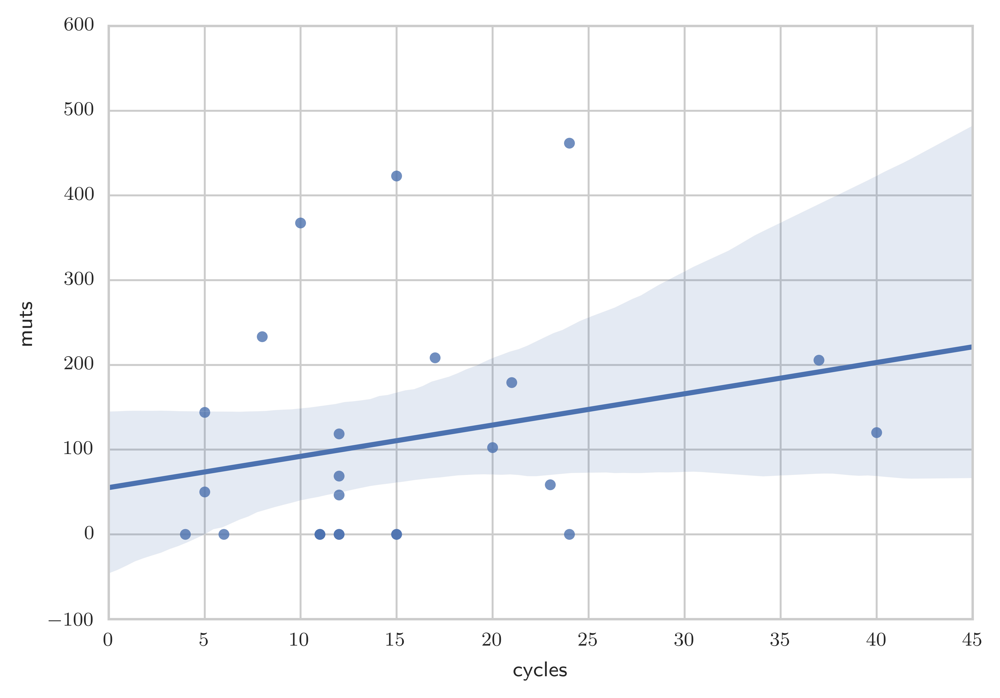

In [495]:
df = new_cohort_df.ix[
    (~new_cohort_df.cisplatin) &
    (new_cohort_df.specific_treatment == "relapse/treated")
][["Cisplatin Gallus gallus mutations", "Cycles of carboplatin", "mutations"]]

df.columns = ["frac", "cycles", "mutations"]
df["percent"] = df.frac * 100.0
df["muts"] = df["frac"] * df["mutations"]

# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 
print(scipy.stats.pearsonr(df.muts.values, df.cycles.values)[0])

seaborn.regplot(data=df, x="cycles", y="muts")

In [472]:
df = stacked.ix[stacked.chemo == "carboplatin"][["mutations", "Cisplatin Gallus gallus mutations num", "Cisplatin Gallus gallus mutations", "cycles"]]
df.columns = ["all_muts", "muts", "frac", "cycles"]
df
scipy.stats.pearsonr(df.cycles.values, df.muts.values)[0]

# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 
print(scipy.stats.pearsonr(df.cycles.values, df.muts.values)[0])

                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                 -0.015
Method:                 Least Squares   F-statistic:                    0.5691
Date:                Mon, 19 Jun 2017   Prob (F-statistic):              0.457
Time:                        21:13:35   Log-Likelihood:                -196.98
No. Observations:                  30   AIC:                             398.0
Df Residuals:                      28   BIC:                             400.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const         99.0578     64.437      1.537      0.1

0.108897217069
                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                 -0.023
Method:                 Least Squares   F-statistic:                    0.3360
Date:                Tue, 20 Jun 2017   Prob (F-statistic):              0.567
Time:                        09:32:58   Log-Likelihood:                -230.34
No. Observations:                  30   AIC:                             464.7
Df Residuals:                      28   BIC:                             467.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const        607.4873    116.245     

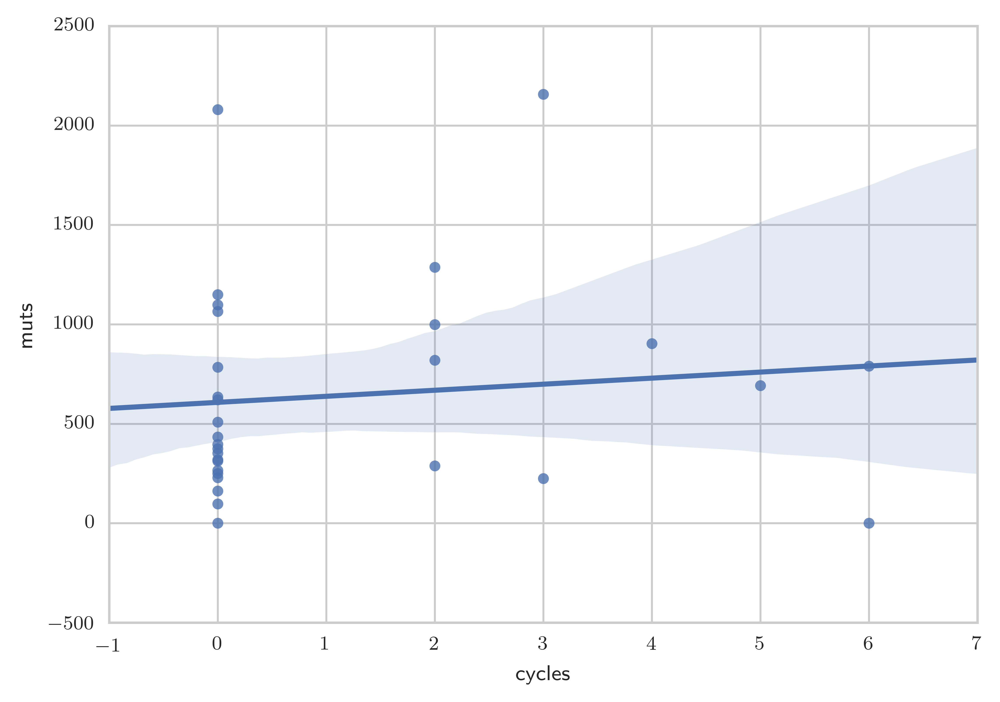

In [492]:
df = stacked.ix[stacked.chemo == "cyclophosphamide"][["mutations", "Cyclophosphamide Gallus gallus mutations num", "Cyclophosphamide Gallus gallus mutations", "cycles"]]
df.columns = ["all_muts", "muts", "frac", "cycles"]
df
print(scipy.stats.pearsonr(df.cycles.values, df.muts.values)[0])

# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))

(df.cycles > 0).sum() 

seaborn.regplot(data=df, x="cycles", y="muts")

In [455]:
df = stacked.ix[stacked.chemo == "platinum"][["mutations", "Cisplatin Gallus gallus mutations num", "Cisplatin Gallus gallus mutations", "cycles"]]
df.columns = ["all_muts", "muts", "frac", "cycles"]
df

(df.all_muts * df.frac) == df.muts
(df.cycles)

12     True
26     True
40     True
54     True
68     True
82     True
96     True
110    True
124    True
138    True
152    True
166    True
180    True
194    True
208    True
222    True
236    True
250    True
264    True
278    True
292    True
306    True
320    True
334    True
348    True
362    True
376    True
390    True
404    True
418    True
dtype: bool

In [456]:
scipy.stats.pearsonr(df.cycles.values, df.muts.values)[0]
scipy.stats.pearsonr(df.cycles.values, df.frac.values)[0]
scipy.stats.pearsonr(df.cycles.values, df.all_muts.values)[0]


0.28773555785662769

In [457]:
# regression
import statsmodels.api as sm
model = sm.OLS(df.all_muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))


                            OLS Regression Results                            
Dep. Variable:               all_muts   R-squared:                       0.083
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     2.527
Date:                Mon, 19 Jun 2017   Prob (F-statistic):              0.123
Time:                        20:35:05   Log-Likelihood:                -289.90
No. Observations:                  30   AIC:                             583.8
Df Residuals:                      28   BIC:                             586.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const       1.158e+04   1440.296      8.041      0.0

In [452]:
# regression
import statsmodels.api as sm
model = sm.OLS(df.frac, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))


                            OLS Regression Results                            
Dep. Variable:                   frac   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     8.151
Date:                Mon, 19 Jun 2017   Prob (F-statistic):            0.00801
Time:                        20:33:19   Log-Likelihood:                 94.714
No. Observations:                  30   AIC:                            -185.4
Df Residuals:                      28   BIC:                            -182.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const          0.0003      0.004      0.089      0.9

In [444]:
# regression
import statsmodels.api as sm
model = sm.OLS(df.muts, sm.add_constant(df.cycles))
res = model.fit()
print(res.summary(alpha=0.1))


                            OLS Regression Results                            
Dep. Variable:                   muts   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     8.144
Date:                Mon, 19 Jun 2017   Prob (F-statistic):            0.00804
Time:                        20:24:00   Log-Likelihood:                -193.45
No. Observations:                  30   AIC:                             390.9
Df Residuals:                      28   BIC:                             393.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
const         -1.9867     57.848     -0.034      0.9

In [436]:
res.summary2(alpha=0.1)

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
=================================================================
Model:              OLS              Adj. R-squared:     0.198   
Dependent Variable: y                AIC:                214.6505
Date:               2017-06-19 20:20 BIC:                217.4529
No. Observations:   30               Log-Likelihood:     -105.33 
Df Model:           1                F-statistic:        8.144   
Df Residuals:       28               Prob (F-statistic): 0.00804 
R-squared:          0.225            Scale:              70.302  
-------------------------------------------------------------------
             Coef.    Std.Err.     t      P>|t|    [0.05     0.95] 
-------------------------------------------------------------------
const       12.4191     1.9720   6.2978   0.0000   9.0645   15.7738
x1           0.0252     0.0088   2.8537   0.0080   0.0102    0.0401
-----------------------------------------------------------------
Omnibus:               11.063       Durbin-Watson:          2.016
Prob(Omnibus):         0.004        Jarque-Bera (JB):       9.997
Skew:                  1.166        Prob(JB):               0.007
Kurtosis:              4.601        Condition No.:          288  
=================================================================

"""

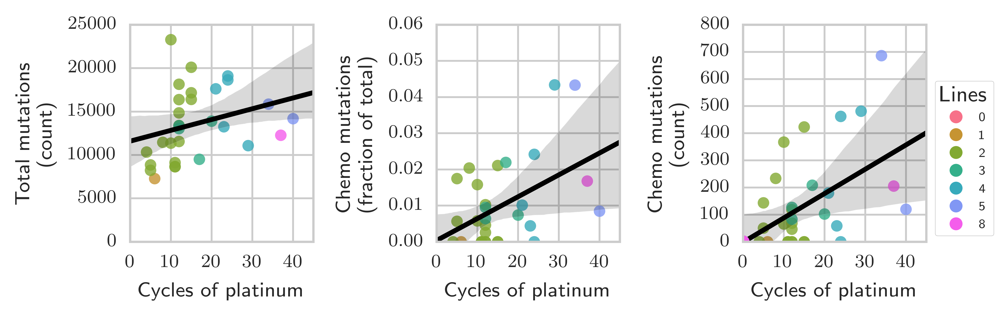

In [363]:
matplotlib.rc('text', usetex=True)


pyplot.figure(figsize=(6,2))
chemos = ["platinum"]
for (row, chemo) in enumerate(chemos):
    pyplot.subplot(len(chemos),3,1 + 3 * row)
    draw(chemo, x="cycles", y="mutations")
    pyplot.xticks(numpy.arange(0, 50, 10))
    pyplot.xlabel("Cycles of platinum")
    #if row == 0:
    #    pyplot.legend(
    #        title="Lines of chemo",
    #        ncol=6,
    #        fancybox=True,
    #        frameon=True,
    #        loc="upper right",
    #        fontsize="small",
    #        bbox_to_anchor=(4,1.35))
    pyplot.ylabel("Total mutations\n(count)")
    if chemo == 'platinum':
        #pyplot.title("All platinum")
        pass
    else:
        pyplot.title(chemo.title())
    
    if 'plat' in chemo:
        signature = "Cisplatin Gallus gallus"
    elif 'cyclo' in chemo:
        signature = "Cyclophosphamide Gallus gallus"
    else:
        raise chemo
    
    latex_sig = signature.replace("Gallus gallus", "\\textit{Gallus gallus}")

    pyplot.subplot(len(chemos),3,2 + 3 * row)
    draw(chemo, x="cycles", y="%s mutations" % signature)
    pyplot.ylabel("Chemo mutations\n(fraction of total)")
    pyplot.xticks(numpy.arange(0, 50, 10))
    pyplot.xlabel("Cycles of platinum")

    #pyplot.gca().yaxis.set_label_position("right")

    pyplot.subplot(len(chemos),3,3 + 3 * row)
    draw(chemo, x="cycles", y="%s mutations num" % signature)
    pyplot.ylabel("Chemo mutations\n(count)")
    #pyplot.gca().yaxis.tick_right()
    #pyplot.gca().yaxis.set_label_position("right")
    pyplot.xticks(numpy.arange(0, 50, 10))
    pyplot.xlabel("Cycles of platinum")

legend_handles = []
legend_labels = []
for (label, color) in lines_to_color.items():
    legend_handles.extend(pyplot.plot([0], [0], label=label, color=color, marker='o', ls='None'))
    legend_labels.append(label)

pyplot.figlegend(
    legend_handles,
    legend_labels,
    "center right",
    title="Lines",
    ncol=1,
    fancybox=True,
    frameon=True,
    fontsize="xx-small")
pyplot.tight_layout(rect=(0, 0, .96, 1))

In [368]:
stacked["Cisplatin Gallus gallus mutations"].max()

0.043373360694725728

In [331]:
new_cohort_df[[c for c in new_cohort_df if 'gallus' in c]]

,Cisplatin Gallus gallus mutations,Cisplatin Gallus gallus neoantigens,Cisplatin Gallus gallus expressed neoantigens,Cyclophosphamide Gallus gallus mutations,Cyclophosphamide Gallus gallus neoantigens,Cyclophosphamide Gallus gallus expressed neoantigens,Etoposide Gallus gallus mutations,Etoposide Gallus gallus neoantigens,Etoposide Gallus gallus expressed neoantigens
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.019489,0.015184,0.014657,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.053486,0.050785,0.058508
3,0.003266,0.003732,0.001969,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.004430,0.006002,0.005297,0.038430,0.027348,0.021599,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.014213,0.009805,0.007598,0.006678,0.005570,0.004540
6,0.017492,0.014046,0.048199,0.020023,0.007717,0.019822,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.012728,0.013151,0.010570,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.004706,0.003461,0.005270,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.044127,0.020035,0.026704,0.035474,0.030872,0.037854


In [322]:
new_cohort_df.columns.tolist()

['source_id',
 'RNA_id',
 'RNA biospecimen',
 'DNA_id',
 'DNA_biospecimen',
 'specimen_type_description',
 'CollectionPoint',
 'SpecimenType',
 'RNA data file',
 'DNA_sample_string',
 'icgc_sample_id',
 'project_code',
 'submitted_sample_id',
 'icgc_specimen_id',
 'submitted_specimen_id',
 'icgc_donor_id',
 'submitted_donor_id',
 'analyzed_sample_interval',
 'percentage_cellularity',
 'level_of_cellularity',
 'study',
 'study_specimen_involved_in',
 'specimen_type',
 'specimen_type_other',
 'specimen_interval',
 'specimen_donor_treatment_type',
 'specimen_donor_treatment_type_other',
 'specimen_processing',
 'specimen_storage',
 'tumour_confirmed',
 'tumour_histological_type',
 'tumour_grading_system',
 'tumour_grade',
 'tumour_stage_system',
 'tumour_stage',
 'cohort',
 'donor',
 'tissue_type',
 'timepoint',
 'treated',
 'metastasis',
 'interval_days',
 'bam_filename_tumor_dna',
 'bam_filename_tumor_rna',
 'treated_paired',
 'timepoint_paired',
 'protein changing',
 'peptides',
 'expr

In [316]:
matplotlib.rc('text', usetex=False)

sub_df = new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
].copy()
sub_df["event"] = sub_df.donor_vital_status == "deceased"

#sub_df["tumour_stage"] = sub_df.tumour_stage.fillna("Unknown")
sub_df["stage3"] = sub_df["tumour_stage"] == "III"
sub_df["stage4"] = sub_df["tumour_stage"] == "IV"

model = lifelines.CoxPHFitter()
model.fit(
    sub_df[["donor_survival_time", "stage4", "event"]],
    'donor_survival_time', 
    event_col="event")
model.summary

,coef,exp(coef),se(coef),z,p,lower 0.95,upper 0.95
stage4,-0.21919,0.803169,0.148846,-1.472598,0.140859,-0.510987,0.072607


In [620]:
sub_df = new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
].copy()
sub_df["event"] = sub_df.donor_vital_status == "deceased"

#sub_df["tumour_stage"] = sub_df.tumour_stage.fillna("Unknown")
sub_df["stage3"] = sub_df["tumour_stage"] == "III"
sub_df["stage4"] = sub_df["tumour_stage"] == "IV"

model = lifelines.CoxPHFitter()
model.fit(
    sub_df[["donor_survival_time", "stage4", "event"]],
    'donor_survival_time', 
    event_col="event")
model.summary

,coef,exp(coef),se(coef),z,p,lower 0.95,upper 0.95
stage4,-0.21919,0.803169,0.148846,-1.472598,0.140859,-0.510987,0.072607


In [126]:
numpy.exp(model.summary.coef)
model.summary

,coef,exp(coef),se(coef),z,p,lower 0.95,upper 0.95
CIBERSORT T cells,-0.35212,0.703196,0.140181,-2.511899,0.012008,-0.62693,-0.07731


In [113]:
(sub_df.mutations > 35000).sum()

1

In [108]:
sub_df = new_cohort_df.ix[
        (new_cohort_df.specific_treatment == "primary/untreated")
        & (new_cohort_df.tissue_type == "solid")
].copy()
sub_df["event"] = sub_df.donor_vital_status == "deceased"

for c in new_cohort_df.columns:
    if c.startswith("CIBERSORT"):
        model = lifelines.CoxPHFitter()
        model.fit(
            sub_df[["donor_survival_time", c, "event"]].ix[~sub_df[c].isnull()],
            'donor_survival_time', 
            event_col="event")
        print(c, model.summary.p)

CIBERSORT B cells naive CIBERSORT B cells naive    0.730261
Name: p, dtype: float64
CIBERSORT B cells memory CIBERSORT B cells memory    0.227848
Name: p, dtype: float64
CIBERSORT Plasma cells CIBERSORT Plasma cells    0.644238
Name: p, dtype: float64
CIBERSORT T cells CD8 CIBERSORT T cells CD8    0.012418
Name: p, dtype: float64
CIBERSORT T cells CD4 naive CIBERSORT T cells CD4 naive    0.137522
Name: p, dtype: float64
CIBERSORT T cells CD4 memory resting CIBERSORT T cells CD4 memory resting    0.18495
Name: p, dtype: float64
CIBERSORT T cells CD4 memory activated CIBERSORT T cells CD4 memory activated    0.117988
Name: p, dtype: float64
CIBERSORT T cells follicular helper CIBERSORT T cells follicular helper    0.030304
Name: p, dtype: float64
CIBERSORT T cells regulatory (Tregs) CIBERSORT T cells regulatory (Tregs)    0.33348
Name: p, dtype: float64
CIBERSORT T cells gamma delta CIBERSORT T cells gamma delta    0.285092
Name: p, dtype: float64
CIBERSORT NK cells resting CIBERSORT NK 